## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [2]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
from sklearn.neural_network import MLPRegressor
sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    print(testPredict.flatten())
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [33]:
df = pd.read_csv(r"../../Datasets/Datos_antes_pandemia/data_antes_vol.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos
0,2010-01-01,0.000000
1,2010-01-02,4.256365
2,2010-01-03,0.794545
3,2010-01-04,0.787899
4,2010-01-05,0.601027
...,...,...
3648,2019-12-27,4.003614
3649,2019-12-28,2.090121
3650,2019-12-29,0.539108
3651,2019-12-30,1.815513


---

## Desarrollo del modelo ELM

In [23]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [24]:
df_stats=df

In [25]:
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

In [26]:
def Model(df_data,df_label,lag,estimators):
    
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    df_label=df_label[lag:]

    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    


    #make model
    model=MLPRegressor(hidden_layer_sizes=(estimators,), activation='logistic', solver='adam')
    #fit the model with the train data
    history=model.fit(df_train,df_train_y_normalize)
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)

    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)

    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.21481357 1.21492375 1.09801697 ... 0.97823808 1.07767035 0.94722995]
[1.23278324 1.63798336 1.30195722 ... 1.46682131 1.12524385 1.34253953]
Evaluation metric results:
MSE is : 1.3392095773655384
MAE is : 0.8427474947735198
RMSE is : 1.1572422293390172
MAPE is : 41.601072675331075
Evaluation metric results:
MSE is : 0.9468541818639132
MAE is : 0.7375269504289603
RMSE is : 0.9730643256557674
MAPE is : 39.555979823410695


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.20060166 1.22516604 1.09480082 ... 0.95729969 1.07958167 0.92983732]
[1.24255368 1.65470661 1.28431459 ... 1.43143325 1.12221565 1.3438812 ]
Evaluation metric results:
MSE is : 1.337907006897922
MAE is : 0.8433875323139584
RMSE is : 1.1566793016640013
MAPE is : 41.64275848510302
Evaluation metric results:
MSE is : 0.946286622782941
MAE is : 0.7361212499598159
RMSE is : 0.9727726470162188
MAPE is : 39.38819981356095


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.20297128 1.22150138 1.10246444 ... 0.96978207 1.07935476 0.93459028]
[1.24019503 1.64323523 1.30196683 ... 1.46403398 1.1220495  1.34289968]
Evaluation metric results:
MSE is : 1.3378249375076994
MAE is : 0.8434968502578906
RMSE is : 1.1566438248258188
MAPE is : 41.66157078844993
Evaluation metric results:
MSE is : 0.9466515359749242
MAE is : 0.7368841875828147
RMSE is : 0.97296019238966
MAPE is : 39.474893714512135


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19050915 1.22807642 1.09786413 ... 0.96748185 1.08708479 0.93773097]
[1.24554169 1.64669881 1.28418465 ... 1.4410903  1.13572551 1.36119553]
Evaluation metric results:
MSE is : 1.3374719429071675
MAE is : 0.8445491374933171
RMSE is : 1.1564912204194062
MAPE is : 41.764016152152415
Evaluation metric results:
MSE is : 0.9456019655121514
MAE is : 0.7367929467185237
RMSE is : 0.9724206731205128
MAPE is : 39.49615263723469


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.18405761 1.24016822 1.09785133 ... 0.9713635  1.08401379 0.93423338]
[1.23733667 1.63322308 1.28401561 ... 1.43000797 1.1270954  1.34208261]
Evaluation metric results:
MSE is : 1.3375258148128142
MAE is : 0.8443583030079731
RMSE is : 1.1565145112850137
MAPE is : 41.731382307944365
Evaluation metric results:
MSE is : 0.9457268581279377
MAE is : 0.7365029183284415
RMSE is : 0.972484888380245
MAPE is : 39.46348469700847


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19078533 1.23260841 1.1021736  ... 0.96358539 1.08239917 0.93416661]
[1.23943207 1.63578346 1.27661978 ... 1.42340148 1.11721358 1.34457576]
Evaluation metric results:
MSE is : 1.3374705140566774
MAE is : 0.8450494119153218
RMSE is : 1.1564906026668256
MAPE is : 41.82101063250296
Evaluation metric results:
MSE is : 0.9455945499658639
MAE is : 0.7359840207987105
RMSE is : 0.9724168601818173
MAPE is : 39.37906954655271


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.16436057 1.22853889 1.08979697 ... 0.95713649 1.07498754 0.92482015]
[1.22919234 1.62742944 1.26280546 ... 1.40673272 1.10300551 1.33063399]
Evaluation metric results:
MSE is : 1.337145847917059
MAE is : 0.8420836416546584
RMSE is : 1.156350227187706
MAPE is : 41.4363325879765
Evaluation metric results:
MSE is : 0.9448806253441251
MAE is : 0.7339470536023214
RMSE is : 0.9720497031243439
MAPE is : 39.15507314773332


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.16160689 1.20247118 1.08352683 ... 0.94950122 1.06590277 0.92087864]
[1.22141746 1.61416996 1.25567021 ... 1.40657294 1.08985481 1.31682329]
Evaluation metric results:
MSE is : 1.3376212932304634
MAE is : 0.8400253393642352
RMSE is : 1.1565557890696252
MAPE is : 41.1602949838005
Evaluation metric results:
MSE is : 0.9440804091153467
MAE is : 0.7320916075343263
RMSE is : 0.9716380031242843
MAPE is : 38.91761722981772


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.1697498  1.22815825 1.08231959 ... 0.95809313 1.07216678 0.92410887]
[1.22307112 1.6264391  1.27075962 ... 1.41604972 1.11512814 1.32916951]
Evaluation metric results:
MSE is : 1.3370461109494
MAE is : 0.841785537880398
RMSE is : 1.1563071006222352
MAPE is : 41.40089635062469
Evaluation metric results:
MSE is : 0.9444119782104148
MAE is : 0.7334382010848897
RMSE is : 0.9718086119243926
MAPE is : 39.09615416841129


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.2763463  1.31860065 1.19286636 ... 1.07088625 1.18377636 1.03995054]
[1.3351354  1.73255443 1.38026022 ... 1.53838168 1.2209968  1.44391193]
Evaluation metric results:
MSE is : 1.3463857680149875
MAE is : 0.8687125916619277
RMSE is : 1.1603386436790717
MAPE is : 44.540031555837174
Evaluation metric results:
MSE is : 0.9667437767143373
MAE is : 0.7635216084885745
RMSE is : 0.983231293600004
MAPE is : 42.47818516119693


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.13787041 1.19727536 1.06835573 ... 0.94543476 1.05909464 0.91365044]
[1.20822332 1.59535183 1.24336551 ... 1.39098601 1.08183546 1.30532801]


<ipython-input-3-72e029a2b199>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 1.338028271372585
MAE is : 0.8372065666114331
RMSE is : 1.1567317197053884
MAPE is : 40.763490607054486
Evaluation metric results:
MSE is : 0.9432498830213117
MAE is : 0.7297173894050107
RMSE is : 0.9712105245626778
MAPE is : 38.64098554862094


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.10765513 1.15596209 1.01172476 ... 0.92348195 1.02834074 0.88391995]
[1.17556344 1.57095409 1.23939535 ... 1.41272761 1.10599203 1.30826556]
Evaluation metric results:
MSE is : 1.343525901751516
MAE is : 0.828884483605921
RMSE is : 1.1591056473641719
MAPE is : 39.5804739171158
Evaluation metric results:
MSE is : 0.9405766855275975
MAE is : 0.7224160906626373
RMSE is : 0.9698333287362306
MAPE is : 37.7250299899156


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.03632178 1.11695124 0.97712854 ... 0.89047094 1.00682086 0.85720728]
[1.15440912 1.54475767 1.18975167 ... 1.36484105 1.05968979 1.28708678]
Evaluation metric results:
MSE is : 1.350391863403299
MAE is : 0.8230212013005644
RMSE is : 1.162063622786334
MAPE is : 38.65273972088598
Evaluation metric results:
MSE is : 0.9419275657193417
MAE is : 0.7154947708044391
RMSE is : 0.9705295285148936
MAPE is : 36.78841150482406


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.11763105 1.15162106 0.97791548 ... 0.94374654 1.23332971 1.62354548]
[1.27309668 1.09461797 1.11505376 ... 1.53687014 1.12682877 1.40538212]
Evaluation metric results:
MSE is : 1.3343752049162836
MAE is : 0.8443179978435668
RMSE is : 1.155151593911502
MAPE is : 41.812868573547576
Evaluation metric results:
MSE is : 0.9476957416218602
MAE is : 0.734548131520979
RMSE is : 0.9734966572217185
MAPE is : 39.30619691872148


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.10697496 1.123081   0.96124684 ... 0.9320216  1.2135271  1.61254758]
[1.24764752 1.07613771 1.10896572 ... 1.51855133 1.11428826 1.41553698]
Evaluation metric results:
MSE is : 1.3322456681587016
MAE is : 0.8386897638445889
RMSE is : 1.1542294694551434
MAPE is : 41.11519482232419
Evaluation metric results:
MSE is : 0.9423865391967092
MAE is : 0.7299008100014917
RMSE is : 0.9707659549019574
MAPE is : 38.88324999852202


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.13028915 1.13410156 0.96612174 ... 0.95063237 1.23500099 1.63190816]
[1.24671135 1.10345741 1.12880188 ... 1.47978372 1.15725538 1.44001338]
Evaluation metric results:
MSE is : 1.3330345194146591
MAE is : 0.8431072195827445
RMSE is : 1.154571140906726
MAPE is : 41.66680509178622
Evaluation metric results:
MSE is : 0.9430986394626705
MAE is : 0.733679358560674
RMSE is : 0.9711326580146867
MAPE is : 39.30417834141364


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.13543004 1.13159143 0.98045655 ... 0.9574414  1.22456957 1.61313074]
[1.26322781 1.08870628 1.11967908 ... 1.4975589  1.11733059 1.40232463]
Evaluation metric results:
MSE is : 1.3350461566228704
MAE is : 0.8434477512154771
RMSE is : 1.1554419745806668
MAPE is : 41.68667148466076
Evaluation metric results:
MSE is : 0.9437166154691536
MAE is : 0.7339821472862051
RMSE is : 0.9714507787166335
MAPE is : 39.30659613847484


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.1053796  1.11334896 0.95480656 ... 0.94791017 1.22036235 1.61046156]
[1.24563078 1.08500477 1.12088109 ... 1.49195129 1.10968299 1.40747356]
Evaluation metric results:
MSE is : 1.3351963529489108
MAE is : 0.8397431488788453
RMSE is : 1.1555069679361136
MAPE is : 41.196892393658395
Evaluation metric results:
MSE is : 0.9426356321755845
MAE is : 0.7320270127099859
RMSE is : 0.9708942435587846
MAPE is : 39.09843976855475


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.12978049 1.12814553 0.97337441 ... 0.95294622 1.22517985 1.61297794]
[1.24947894 1.08823763 1.11871475 ... 1.46465625 1.10904037 1.39204536]
Evaluation metric results:
MSE is : 1.334101463165145
MAE is : 0.842577004817986
RMSE is : 1.155033100462989
MAPE is : 41.54753890025727
Evaluation metric results:
MSE is : 0.9439966847977452
MAE is : 0.7346267852983976
RMSE is : 0.9715949180588304
MAPE is : 39.42126934457244


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.16971947 1.16399628 1.0040231  ... 0.96204673 1.22502413 1.60730053]
[1.25021149 1.09872949 1.13818998 ... 1.48211961 1.10343726 1.40491926]
Evaluation metric results:
MSE is : 1.3362032685378942
MAE is : 0.8492906768337144
RMSE is : 1.1559425887724244
MAPE is : 42.36549849980564
Evaluation metric results:
MSE is : 0.9458484931061462
MAE is : 0.7361845869831953
RMSE is : 0.9725474246051686
MAPE is : 39.53364627662926


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.1218089  1.11430798 0.9738106  ... 0.94732959 1.21546055 1.5970184 ]
[1.23202103 1.07609171 1.11365675 ... 1.45253307 1.08634432 1.38345989]
Evaluation metric results:
MSE is : 1.3348785051183216
MAE is : 0.8402778885995775
RMSE is : 1.155369423655621
MAPE is : 41.242585660864876
Evaluation metric results:
MSE is : 0.9422805997343818
MAE is : 0.7313959744396437
RMSE is : 0.9707113884849512
MAPE is : 39.02108507113106


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.11239444 1.1038968  0.9513285  ... 0.94280197 1.20989689 1.60691466]
[1.25240977 1.08573162 1.11174874 ... 1.48713685 1.1028004  1.39616042]
Evaluation metric results:
MSE is : 1.335175381327946
MAE is : 0.8401809893608991
RMSE is : 1.1554978932598476
MAPE is : 41.230423403954944
Evaluation metric results:
MSE is : 0.9432741618871539
MAE is : 0.7312589225362567
RMSE is : 0.9712230237629017
MAPE is : 38.993642150760046


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.17043444 1.16558409 1.01572862 ... 0.96801526 1.22855749 1.60844045]
[1.25011143 1.10073898 1.13967482 ... 1.45733336 1.08418763 1.38750658]
Evaluation metric results:
MSE is : 1.3366414141698635
MAE is : 0.8515161565284086
RMSE is : 1.1561320920075973
MAPE is : 42.57900984029466
Evaluation metric results:
MSE is : 0.9476041533005204
MAE is : 0.7382230480824924
RMSE is : 0.9734496151833029
MAPE is : 39.78586114576589


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.01071693 1.00104743 0.8568453  ... 0.85032018 1.11318655 1.49283417]
[1.12987285 0.98363743 1.02005279 ... 1.35148279 0.98756939 1.29191485]
Evaluation metric results:
MSE is : 1.3500069212179475
MAE is : 0.8215394696987
RMSE is : 1.1618979822763906
MAPE is : 38.42696609105017
Evaluation metric results:
MSE is : 0.9421208931694791
MAE is : 0.7109534627070818
RMSE is : 0.9706291223580091
MAPE is : 36.27311704526876


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.09677556 1.09196747 0.94208836 ... 0.93214997 1.18701586 1.56668396]
[1.22528828 1.07827618 1.10419032 ... 1.44806106 1.08999184 1.37919404]
Evaluation metric results:
MSE is : 1.3354610940803413
MAE is : 0.8367604555472691
RMSE is : 1.1556215185260013
MAPE is : 40.744015546868674
Evaluation metric results:
MSE is : 0.9416491560374471
MAE is : 0.7264365731791562
RMSE is : 0.9703860860695845
MAPE is : 38.41408900739119


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[0.99736931 0.97563945 0.80829472 ... 0.83483355 1.07922157 1.47027462]
[1.13163015 0.98798334 1.02685312 ... 1.37549771 1.00488597 1.3228638 ]
Evaluation metric results:
MSE is : 1.3552432065517286
MAE is : 0.8181863950813466
RMSE is : 1.1641491341540948
MAPE is : 37.84803405370108
Evaluation metric results:
MSE is : 0.9445232769444621
MAE is : 0.7084239853418557
RMSE is : 0.9718658739478726
MAPE is : 35.89364910268047


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.0263331  1.62741845 1.13658098 ... 1.63313415 1.22477076 1.0270091 ]
[1.05212798 0.92331863 1.31029732 ... 1.55949883 1.16247078 1.46804352]
Evaluation metric results:
MSE is : 1.3291461172768058
MAE is : 0.841408566794758
RMSE is : 1.152885994917453
MAPE is : 41.50942370590839
Evaluation metric results:
MSE is : 0.9329274502095858
MAE is : 0.7258545585281599
RMSE is : 0.9658816957627812
MAPE is : 38.78416767658804


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.02810874 1.63976314 1.13513062 ... 1.63186151 1.2254722  1.03186278]
[1.0817001  0.95449058 1.32585903 ... 1.58511419 1.16281395 1.52097932]
Evaluation metric results:
MSE is : 1.327327294368585
MAE is : 0.840757045371689
RMSE is : 1.1520969118822362
MAPE is : 41.442532023761636
Evaluation metric results:
MSE is : 0.9308220459308628
MAE is : 0.7254527333560767
RMSE is : 0.9647911929173394
MAPE is : 38.757741449672466


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.10866822 1.78378349 1.18652795 ... 1.69054312 1.21092172 1.00667625]
[1.05059191 0.91131561 1.33133801 ... 1.64693799 1.2409435  1.58791936]
Evaluation metric results:
MSE is : 1.306040405505503
MAE is : 0.8358520608201485
RMSE is : 1.1428212482735447
MAPE is : 41.257125527178374
Evaluation metric results:
MSE is : 0.9307242011480668
MAE is : 0.7229402471834886
RMSE is : 0.9647404838338997
MAPE is : 38.473023246645866


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.07179981 1.67581101 1.17030434 ... 1.6365594  1.21627818 1.03127738]
[1.07651403 0.94273147 1.31774122 ... 1.59277748 1.27906779 1.45326473]
Evaluation metric results:
MSE is : 1.3178397329722793
MAE is : 0.8397033449891399
RMSE is : 1.147972008793019
MAPE is : 41.410725759262554
Evaluation metric results:
MSE is : 0.9324760285035626
MAE is : 0.7244605449051011
RMSE is : 0.9656479837412609
MAPE is : 38.52445830609138


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.0459767  1.67196886 1.16482021 ... 1.61869386 1.21401344 1.03354794]
[1.06121941 0.9301544  1.3232658  ... 1.55906363 1.24478972 1.48114648]
Evaluation metric results:
MSE is : 1.3182464886324876
MAE is : 0.8381324748277437
RMSE is : 1.1481491578329392
MAPE is : 41.202459409545604
Evaluation metric results:
MSE is : 0.9309801056850063
MAE is : 0.7222694814332421
RMSE is : 0.9648731034104984
MAPE is : 38.303358597455365


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.09786508 1.73385305 1.19683612 ... 1.68060395 1.22849908 1.03848174]
[1.07970096 0.94012057 1.34668588 ... 1.6666787  1.33787992 1.52899691]
Evaluation metric results:
MSE is : 1.3103716907023202
MAE is : 0.8390035898262224
RMSE is : 1.144714676547095
MAPE is : 41.48141243425188
Evaluation metric results:
MSE is : 0.9306187605690829
MAE is : 0.7239436299451325
RMSE is : 0.9646858351655646
MAPE is : 38.49945341224888


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.02134702 1.65452604 1.14897257 ... 1.60904044 1.20104475 1.01461296]
[1.05840803 0.91470419 1.27309647 ... 1.50635088 1.10927785 1.46576335]
Evaluation metric results:
MSE is : 1.3275804299200387
MAE is : 0.8446297696921373
RMSE is : 1.1522067652639603
MAPE is : 41.84203140017475
Evaluation metric results:
MSE is : 0.932972529142802
MAE is : 0.7219456512342732
RMSE is : 0.9659050311199348
MAPE is : 38.19724065096551


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.97961937 1.61826113 1.09792212 ... 1.59584607 1.18357493 1.00722685]
[1.05573773 0.90995588 1.28013261 ... 1.51440598 1.12443966 1.48764523]
Evaluation metric results:
MSE is : 1.3276767956171682
MAE is : 0.836619361164914
RMSE is : 1.1522485823888733
MAPE is : 40.833829392228985
Evaluation metric results:
MSE is : 0.9304477689506943
MAE is : 0.7167589693422433
RMSE is : 0.964597205547836
MAPE is : 37.586482606232096


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.02521945 1.64285061 1.14979463 ... 1.61270837 1.20499394 1.02498059]
[1.06749065 0.91913087 1.28354867 ... 1.4935164  1.11863397 1.4618241 ]
Evaluation metric results:
MSE is : 1.327108845096115
MAE is : 0.8449039873042786
RMSE is : 1.1520021029043805
MAPE is : 41.875323283051294
Evaluation metric results:
MSE is : 0.9338320434998405
MAE is : 0.7228325710478909
RMSE is : 0.9663498556422723
MAPE is : 38.29891570902619


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.99310439 1.63468331 1.13022102 ... 1.64855395 1.23916261 1.06229912]
[1.10525289 0.94700537 1.31798667 ... 1.55847366 1.18173005 1.54775373]
Evaluation metric results:
MSE is : 1.3268182877954573
MAE is : 0.8420050924607658
RMSE is : 1.1518759862916916
MAPE is : 41.5460982980087
Evaluation metric results:
MSE is : 0.9335134504093489
MAE is : 0.7276452009361299
RMSE is : 0.9661849980254035
MAPE is : 38.990256192702304


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.0613831  1.68981319 1.20333099 ... 1.68875103 1.28534983 1.10692311]
[1.16588204 1.00557889 1.35735856 ... 1.57486498 1.18761684 1.57298483]
Evaluation metric results:
MSE is : 1.332292689522915
MAE is : 0.8581856691761675
RMSE is : 1.1542498384331337
MAPE is : 43.481558286234176
Evaluation metric results:
MSE is : 0.9454379156101969
MAE is : 0.7448836901417616
RMSE is : 0.972336318158587
MAPE is : 40.917574359248086


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.05881385 1.69955865 1.20331012 ... 1.70577913 1.31862718 1.13343126]
[1.19891601 1.05792864 1.38477399 ... 1.65943567 1.22939563 1.61621972]
Evaluation metric results:
MSE is : 1.3355796578964585
MAE is : 0.86324558508465
RMSE is : 1.1556728161103638
MAPE is : 44.05470488108742
Evaluation metric results:
MSE is : 0.9537359778341129
MAE is : 0.7538439497368186
RMSE is : 0.9765940701407688
MAPE is : 41.90488234499991


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.05270343 1.73191444 1.19800282 ... 1.75607436 1.35775139 1.17086491]
[1.23691591 1.08293807 1.43504695 ... 1.74060272 1.30866103 1.71833047]
Evaluation metric results:
MSE is : 1.3389544577468606
MAE is : 0.8661419434533497
RMSE is : 1.1571319966826865
MAPE is : 44.36429115033297
Evaluation metric results:
MSE is : 0.9599532189644977
MAE is : 0.760324361358907
RMSE is : 0.9797720239752193
MAPE is : 42.64322700422065


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.64999693 1.25158071 1.13011789 ... 1.22103757 1.00998087 1.02110022]
[0.9110001  1.27279317 1.54810939 ... 1.55745588 1.24200457 1.49824737]
Evaluation metric results:
MSE is : 1.3229619459440445
MAE is : 0.8409827559504252
RMSE is : 1.1502008285269336
MAPE is : 41.5414352463087
Evaluation metric results:
MSE is : 0.9267308692120075
MAE is : 0.7217143738289895
RMSE is : 0.9626686185868986
MAPE is : 38.28409817899819


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.61940149 1.22265004 1.09400622 ... 1.24815142 1.03013214 1.05149242]
[0.91979406 1.29312587 1.59245667 ... 1.51601713 1.17022648 1.46470231]
Evaluation metric results:
MSE is : 1.326443743804998
MAE is : 0.8404248908703587
RMSE is : 1.1517133948187797
MAPE is : 41.41305282180691
Evaluation metric results:
MSE is : 0.9296441203347657
MAE is : 0.7229368806674059
RMSE is : 0.9641805434330054
MAPE is : 38.426340159080524


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.81622072 1.33047037 1.13984178 ... 1.20518981 0.97895961 1.03344566]
[0.89155488 1.32676316 1.67548731 ... 1.54292112 1.23970972 1.42433767]
Evaluation metric results:
MSE is : 1.29823898073449
MAE is : 0.8315876294692774
RMSE is : 1.1394029053563495
MAPE is : 40.90813622139934
Evaluation metric results:
MSE is : 0.932329418294443
MAE is : 0.7199881243350275
RMSE is : 0.9655720678926266
MAPE is : 37.9670770462649


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.63955825 1.21219809 1.11462306 ... 1.21932625 1.02559249 1.06254901]
[0.92889468 1.29407647 1.58046894 ... 1.53435322 1.19713659 1.52538814]
Evaluation metric results:
MSE is : 1.3208221716080146
MAE is : 0.8387127507327605
RMSE is : 1.1492702778754937
MAPE is : 41.26347970402102
Evaluation metric results:
MSE is : 0.9276929332250637
MAE is : 0.7212680801530259
RMSE is : 0.963168174944056
MAPE is : 38.23815439103778


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.86153368 1.31772091 1.18131377 ... 1.17628696 0.93334786 0.99685237]
[0.87165122 1.33137911 1.61470012 ... 1.55379283 1.2441215  1.41851475]
Evaluation metric results:
MSE is : 1.2975910806439312
MAE is : 0.8359330797173593
RMSE is : 1.1391185542532134
MAPE is : 41.3880112682044
Evaluation metric results:
MSE is : 0.9285670035435317
MAE is : 0.7178927262914174
RMSE is : 0.9636218156224629
MAPE is : 37.744945640229005


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.61121217 1.16500567 1.09258303 ... 1.18738423 1.0026187  1.0433354 ]
[0.90951856 1.25789062 1.52193527 ... 1.48254503 1.1078505  1.45274987]
Evaluation metric results:
MSE is : 1.3262499071155975
MAE is : 0.8389764529367039
RMSE is : 1.1516292403007131
MAPE is : 41.18702848829831
Evaluation metric results:
MSE is : 0.9285108545883834
MAE is : 0.7181929052566479
RMSE is : 0.9635926808503599
MAPE is : 37.80887614325779


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.61716812 1.18618271 1.10120749 ... 1.21216374 1.02065476 1.05022422]
[0.91184749 1.26417024 1.54572579 ... 1.47881753 1.13047679 1.46167189]
Evaluation metric results:
MSE is : 1.3261231603081607
MAE is : 0.8427350119171082
RMSE is : 1.1515742096400738
MAPE is : 41.64554545867748
Evaluation metric results:
MSE is : 0.9298715667276918
MAE is : 0.7217281934583814
RMSE is : 0.9642984842504377
MAPE is : 38.245991173396696


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.63489729 1.20306256 1.12715429 ... 1.23887523 1.05821297 1.08730493]
[0.95127877 1.30162275 1.57378973 ... 1.51318136 1.18864591 1.50229602]
Evaluation metric results:
MSE is : 1.3276173587511493
MAE is : 0.8472234387960789
RMSE is : 1.1522227904147484
MAPE is : 42.19383958865438
Evaluation metric results:
MSE is : 0.9323619281450667
MAE is : 0.7291654902637082
RMSE is : 0.9655889022482946
MAPE is : 39.17908524644366


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.59590957 1.17550044 1.09371346 ... 1.19377349 1.00657536 1.03289355]
[0.89939336 1.24857858 1.53126888 ... 1.47231234 1.12183591 1.44415717]
Evaluation metric results:
MSE is : 1.3263665143092471
MAE is : 0.8366688598313003
RMSE is : 1.1516798662428926
MAPE is : 40.867395177389795
Evaluation metric results:
MSE is : 0.9286503601174243
MAE is : 0.7176274685504216
RMSE is : 0.9636650663573025
MAPE is : 37.7163076632292


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.5246147  1.08388655 1.01684972 ... 1.17494188 0.98971234 1.02364964]
[0.87734438 1.2244945  1.50640194 ... 1.47974403 1.10993911 1.45856012]
Evaluation metric results:
MSE is : 1.333697061299939
MAE is : 0.8276600588698111
RMSE is : 1.1548580264690285
MAPE is : 39.57420883662787
Evaluation metric results:
MSE is : 0.9274265017005431
MAE is : 0.7127093669521668
RMSE is : 0.9630298550411317
MAPE is : 37.130696755075746


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.6125989  1.19842869 1.13118011 ... 1.2486685  1.06473162 1.09111892]
[0.94681994 1.28328749 1.57354632 ... 1.53272882 1.18148373 1.5198378 ]
Evaluation metric results:
MSE is : 1.3274036845257562
MAE is : 0.8464852623933138
RMSE is : 1.1521300640664474
MAPE is : 42.11422508540152
Evaluation metric results:
MSE is : 0.9321373235018422
MAE is : 0.724575875902516
RMSE is : 0.965472590756383
MAPE is : 38.552354280157154


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.501136   1.06271019 1.0155506  ... 1.17593236 1.00358722 1.03516015]
[0.90159004 1.23830673 1.49673839 ... 1.46747855 1.11335197 1.45440122]
Evaluation metric results:
MSE is : 1.3361149776483865
MAE is : 0.8254988117119448
RMSE is : 1.155904398143889
MAPE is : 39.24840055533739
Evaluation metric results:
MSE is : 0.9275553000720459
MAE is : 0.715188783540584
RMSE is : 0.963096724151861
MAPE is : 37.42921098868487


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.75775097 1.27086648 1.25986681 ... 1.4073976  1.25650288 1.31344025]
[1.16243338 1.5141316  1.76310537 ... 1.74724118 1.40368872 1.79590261]
Evaluation metric results:
MSE is : 1.3580836723974905
MAE is : 0.888114168312341
RMSE is : 1.1653684706553076
MAPE is : 46.686013396145704
Evaluation metric results:
MSE is : 0.9836967442788773
MAE is : 0.7809565881978585
RMSE is : 0.9918148739955845
MAPE is : 44.54895645693945


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.15909337 1.28616312 1.06423247 ... 1.01298866 0.92270735 1.33986552]
[1.64038457 1.21459733 0.95596154 ... 1.48422653 1.29058803 1.39391342]
Evaluation metric results:
MSE is : 1.3062624123790176
MAE is : 0.8379519674790176
RMSE is : 1.142918375204029
MAPE is : 41.510709776822985
Evaluation metric results:
MSE is : 0.9226776192172397
MAE is : 0.7173459508754443
RMSE is : 0.9605610960356659
MAPE is : 37.86875296580512


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.15780566 1.29719742 1.01867051 ... 1.00785901 0.883436   1.34347276]
[1.67960024 1.26362908 0.97143753 ... 1.50511975 1.34556476 1.42328871]
Evaluation metric results:
MSE is : 1.293596109142413
MAE is : 0.8333723635071955
RMSE is : 1.1373636661782427
MAPE is : 41.2267416426349
Evaluation metric results:
MSE is : 0.9200393013399847
MAE is : 0.717202174896905
RMSE is : 0.9591867916834472
MAPE is : 38.04294687888605


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.17968601 1.24921241 1.01580713 ... 1.03597594 0.90728068 1.35845493]
[1.68830341 1.16736603 0.90755344 ... 1.48439753 1.24802433 1.43519039]
Evaluation metric results:
MSE is : 1.2880496518019622
MAE is : 0.8298659503613315
RMSE is : 1.1349227514689986
MAPE is : 40.936611475079594
Evaluation metric results:
MSE is : 0.9288444415611063
MAE is : 0.7178616864808864
RMSE is : 0.9637657607329212
MAPE is : 37.82917429068149


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.14457771 1.3063774  1.04502262 ... 1.02375586 0.91312542 1.33877165]
[1.68080701 1.16724764 0.93127786 ... 1.50863218 1.21772767 1.38215129]
Evaluation metric results:
MSE is : 1.2865940201030166
MAE is : 0.8303031096574784
RMSE is : 1.134281279093954
MAPE is : 41.04140652800295
Evaluation metric results:
MSE is : 0.9317727859377668
MAE is : 0.7198391090639781
RMSE is : 0.9652837851832832
MAPE is : 37.85242089123663


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.20185599 1.28887855 1.08010362 ... 1.02664123 0.91307464 1.35031366]
[1.60242499 1.15722427 0.93026745 ... 1.54191201 1.24026509 1.38125081]
Evaluation metric results:
MSE is : 1.2805435303510844
MAE is : 0.8292481112695423
RMSE is : 1.1316110331518885
MAPE is : 41.0153632611606
Evaluation metric results:
MSE is : 0.923966499368237
MAE is : 0.7172905538852158
RMSE is : 0.9612317615269675
MAPE is : 37.91723013089345


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.06159819 1.2256716  1.02379448 ... 1.04824689 0.93715849 1.28684628]
[1.57271374 1.16393051 0.97900066 ... 1.45815257 1.1409409  1.44154978]
Evaluation metric results:
MSE is : 1.325965488106817
MAE is : 0.8429868028389503
RMSE is : 1.1515057481866156
MAPE is : 41.659565333726356
Evaluation metric results:
MSE is : 0.9283185942438237
MAE is : 0.7219665788932672
RMSE is : 0.9634929134372622
MAPE is : 38.33298526079788


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.12238408 1.23965107 0.99276642 ... 1.03435505 0.90839309 1.35503434]
[1.67335739 1.15018443 0.95261806 ... 1.51657299 1.24441789 1.47998021]
Evaluation metric results:
MSE is : 1.2879946260628463
MAE is : 0.8262125132065555
RMSE is : 1.134898509146455
MAPE is : 40.47585562913583
Evaluation metric results:
MSE is : 0.9239872658648443
MAE is : 0.717755237526183
RMSE is : 0.9612425634900091
MAPE is : 38.016227758720895


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.02616859 1.18160873 0.98918537 ... 1.05730906 0.95022316 1.30203624]
[1.57434305 1.17207522 0.9737307  ... 1.48195152 1.209203   1.47567557]
Evaluation metric results:
MSE is : 1.3259993790951703
MAE is : 0.8323213398834031
RMSE is : 1.151520464036645
MAPE is : 40.31508009676138
Evaluation metric results:
MSE is : 0.9241843348040041
MAE is : 0.718345984560664
RMSE is : 0.961345065418242
MAPE is : 37.97673799850879


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.13153105 1.29761439 1.09018295 ... 1.05736149 0.93266525 1.27785348]
[1.57330109 1.17330162 0.99412802 ... 1.43680427 1.13836673 1.43610545]
Evaluation metric results:
MSE is : 1.3262930730114
MAE is : 0.8528256187004155
RMSE is : 1.1516479813777298
MAPE is : 42.85077372864725
Evaluation metric results:
MSE is : 0.930343233565218
MAE is : 0.7221715530210333
RMSE is : 0.9645430179962001
MAPE is : 38.2784825560335


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.00613098 1.18760005 0.96809705 ... 1.03727454 0.90745401 1.23551435]
[1.53177538 1.1346677  0.960991   ... 1.43316259 1.10039374 1.40904621]
Evaluation metric results:
MSE is : 1.3302950135777818
MAE is : 0.8319763604197464
RMSE is : 1.1533841569823047
MAPE is : 40.156769293691816
Evaluation metric results:
MSE is : 0.9260518765550367
MAE is : 0.7135144474084151
RMSE is : 0.9623158922905912
MAPE is : 37.271517036230186


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.02900801 1.19901839 1.02096929 ... 1.0119028  0.90382055 1.23218679]
[1.52402735 1.11573538 0.91468819 ... 1.3841502  1.04707347 1.35259396]
Evaluation metric results:
MSE is : 1.3288840778766364
MAE is : 0.8394778336652454
RMSE is : 1.1527723443406492
MAPE is : 41.125938581928715
Evaluation metric results:
MSE is : 0.9297654264826706
MAE is : 0.7122511503199843
RMSE is : 0.9642434477260764
MAPE is : 36.95952264273319


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.03510069 1.19170296 0.98266645 ... 1.06357754 0.94555144 1.29777148]
[1.57720172 1.17805835 1.01565716 ... 1.46616667 1.16516948 1.45345436]
Evaluation metric results:
MSE is : 1.329067089471634
MAE is : 0.8362153593987722
RMSE is : 1.152851720505128
MAPE is : 40.74605227746715
Evaluation metric results:
MSE is : 0.9284382852781073
MAE is : 0.7232486024285724
RMSE is : 0.9635550245201917
MAPE is : 38.516796357488325


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.03233289 1.14614081 0.9768305  ... 0.89448768 0.75985857 1.09598042]
[1.36120057 0.98254248 0.82378603 ... 1.08829324 0.80016386 1.14176276]
Evaluation metric results:
MSE is : 1.3541363717681465
MAE is : 0.8322898669150226
RMSE is : 1.1636736534648133
MAPE is : 39.41677876868668
Evaluation metric results:
MSE is : 0.9471770459759602
MAE is : 0.6988233354879964
RMSE is : 0.9732302122190619
MAPE is : 34.649571557922066


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.88468295 1.36601791 1.10773854 ... 0.90147584 0.94726748 0.79336088]
[0.99426896 1.32565089 1.1210844  ... 1.47306409 1.45325377 1.31218038]
Evaluation metric results:
MSE is : 1.2497271904522385
MAE is : 0.8182860266237187
RMSE is : 1.1179119779536484
MAPE is : 40.2268152636856
Evaluation metric results:
MSE is : 0.9154347364331133
MAE is : 0.7005598137126345
RMSE is : 0.9567835368739961
MAPE is : 36.30679374219387


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.89922405 1.39682329 1.21088196 ... 0.8948203  0.84995032 0.70183201]
[1.07068515 1.25782895 1.05149653 ... 1.39891239 1.2509852  1.2001641 ]
Evaluation metric results:
MSE is : 1.2330862782594292
MAE is : 0.817263174933567
RMSE is : 1.110444180613969
MAPE is : 40.47272541292822
Evaluation metric results:
MSE is : 0.9218117079301671
MAE is : 0.7013678929282514
RMSE is : 0.9601102582152568
MAPE is : 36.25685015655684


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.97769826 1.45162621 1.11424327 ... 0.89294043 0.80786847 0.65575612]
[1.00911119 1.31646675 1.08024621 ... 1.34190757 1.10704044 1.13067069]
Evaluation metric results:
MSE is : 1.2166641575227601
MAE is : 0.8152358742347505
RMSE is : 1.103025003126747
MAPE is : 40.46202845317598
Evaluation metric results:
MSE is : 0.9252630938563725
MAE is : 0.6990452163643464
RMSE is : 0.9619059693423118
MAPE is : 35.91067402121894


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.8818341  1.3722751  1.1046928  ... 0.93373362 0.82102148 0.72167697]
[1.07845322 1.26281852 1.01985107 ... 1.47719849 1.22718663 1.32084836]
Evaluation metric results:
MSE is : 1.2093191921286979
MAE is : 0.8070508011585706
RMSE is : 1.0996904983351896
MAPE is : 39.64401478643431
Evaluation metric results:
MSE is : 0.9221325164342226
MAE is : 0.7033884903887901
RMSE is : 0.9602773122563203
MAPE is : 36.64934523461484


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.89118813 1.30121826 1.11337906 ... 0.88037891 0.84898026 0.71621867]
[1.03237783 1.29146488 1.10203399 ... 1.48732094 1.29022079 1.18537398]
Evaluation metric results:
MSE is : 1.1975117103019983
MAE is : 0.8033182052059584
RMSE is : 1.0943087819724369
MAPE is : 39.51971269640735
Evaluation metric results:
MSE is : 0.926627859698702
MAE is : 0.7076345500081866
RMSE is : 0.9626151150375222
MAPE is : 37.11414374682585


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.9345961  1.41074164 1.10194795 ... 0.91723306 0.86589585 0.68042009]
[1.00861496 1.30749358 0.99858309 ... 1.35020229 1.30172445 1.15543765]
Evaluation metric results:
MSE is : 1.2006928265020995
MAE is : 0.8056489210662582
RMSE is : 1.0957612999655078
MAPE is : 39.63875410686405
Evaluation metric results:
MSE is : 0.9236893226984171
MAE is : 0.7106470936759471
RMSE is : 0.9610875728560936
MAPE is : 37.49605490760554


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.92152401 1.34099577 1.18632595 ... 0.92084049 0.88793526 0.7303451 ]
[1.00381444 1.30742854 1.04262497 ... 1.49763048 1.36123561 1.17387117]
Evaluation metric results:
MSE is : 1.1876103332176078
MAE is : 0.8019771384828333
RMSE is : 1.0897753590614938
MAPE is : 39.51701815567503
Evaluation metric results:
MSE is : 0.9267456187914863
MAE is : 0.7084761292839258
RMSE is : 0.9626762793335496
MAPE is : 37.122781558947906


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.99271087 1.45681039 1.11228939 ... 0.89766595 0.78609262 0.60866627]
[1.01418116 1.35950438 1.08281169 ... 1.28201946 1.31806069 1.13862174]
Evaluation metric results:
MSE is : 1.1919285284072338
MAE is : 0.8090659714515559
RMSE is : 1.0917547931688845
MAPE is : 40.18762001336219
Evaluation metric results:
MSE is : 0.9268922814469519
MAE is : 0.7127755756636617
RMSE is : 0.9627524507613324
MAPE is : 37.63439974770133


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.9475939  1.32557898 1.07256867 ... 0.97157632 0.8676051  0.70311152]
[1.08773895 1.38295435 1.13574633 ... 1.43424335 1.33749639 1.214069  ]
Evaluation metric results:
MSE is : 1.203790919337677
MAE is : 0.8070483333937026
RMSE is : 1.0971740606383642
MAPE is : 39.750468933107285
Evaluation metric results:
MSE is : 0.9314727382245831
MAE is : 0.7240973329334691
RMSE is : 0.9651283532383571
MAPE is : 39.004433177265604


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[2.06861322 1.47333477 1.23816482 ... 0.94549319 0.85280363 0.70318699]
[1.03193339 1.39421292 1.01675802 ... 1.54872897 1.47725162 1.17720989]
Evaluation metric results:
MSE is : 1.1906300866699282
MAE is : 0.8156339150293491
RMSE is : 1.0911599729965942
MAPE is : 41.06636786277113
Evaluation metric results:
MSE is : 0.9291039526440237
MAE is : 0.7145029515623962
RMSE is : 0.9639003852286935
MAPE is : 37.99356756180928


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.70125288 1.22283119 1.07707459 ... 1.00032183 0.92671471 0.79885804]
[1.05807306 1.25565937 1.14205037 ... 1.59568288 1.26064928 1.45688279]
Evaluation metric results:
MSE is : 1.2980689255415498
MAE is : 0.8324593665046585
RMSE is : 1.1393282782155236
MAPE is : 40.945492273834795
Evaluation metric results:
MSE is : 0.9154987731186026
MAE is : 0.709140710030582
RMSE is : 0.9568170008515748
MAPE is : 37.36594165967723


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.73449162 1.26839019 1.08942566 ... 1.08828551 0.99619698 0.87475538]
[1.13192641 1.33709449 1.23992745 ... 1.67005796 1.32090427 1.5415982 ]
Evaluation metric results:
MSE is : 1.2998826902958276
MAE is : 0.8391106760072418
RMSE is : 1.1401239802301448
MAPE is : 41.740074230817456
Evaluation metric results:
MSE is : 0.9257579938065892
MAE is : 0.7282547154478004
RMSE is : 0.9621631846036249
MAPE is : 39.63565314109166


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.852624   1.40282078 1.22722715 ... 0.94158714 0.83533185 0.72848765]
[1.0051168  1.1739418  1.0805672  ... 1.3372083  1.01266686 1.23479984]
Evaluation metric results:
MSE is : 1.315165404507086
MAE is : 0.8610230134093291
RMSE is : 1.1468066116425586
MAPE is : 43.91981694008836
Evaluation metric results:
MSE is : 0.9285559489257645
MAE is : 0.69992869167663
RMSE is : 0.9636160796322177
MAPE is : 35.59406916357693


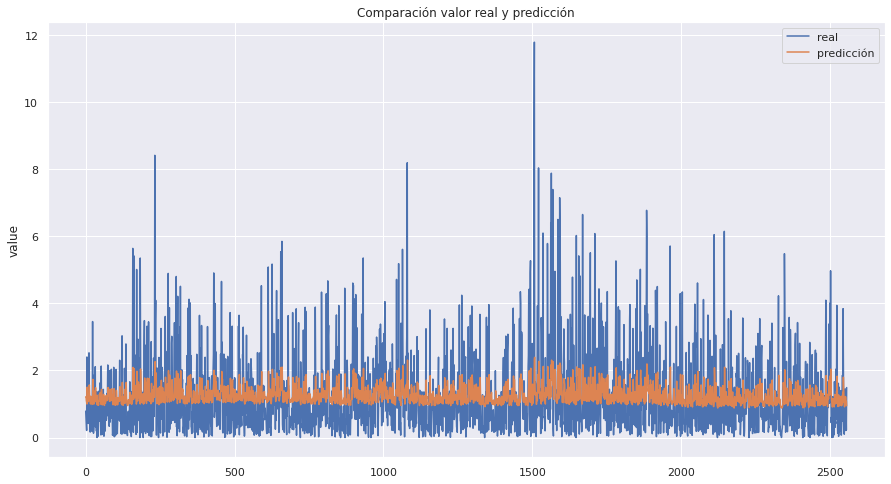

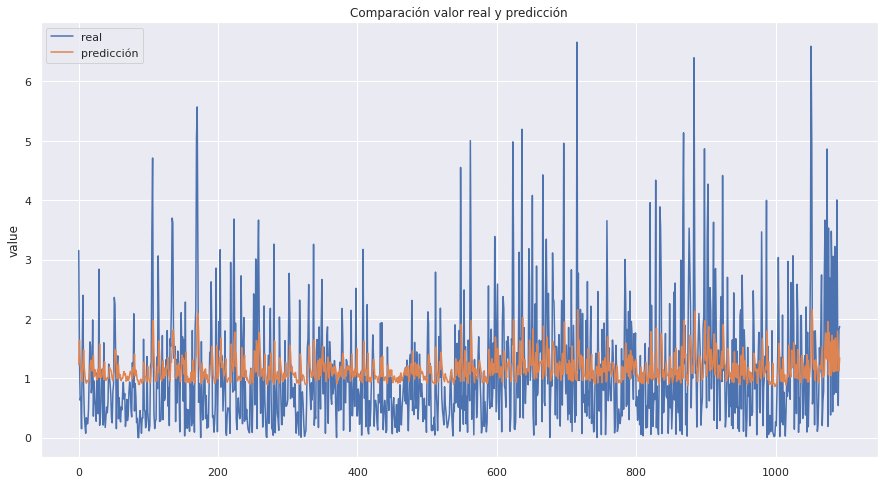

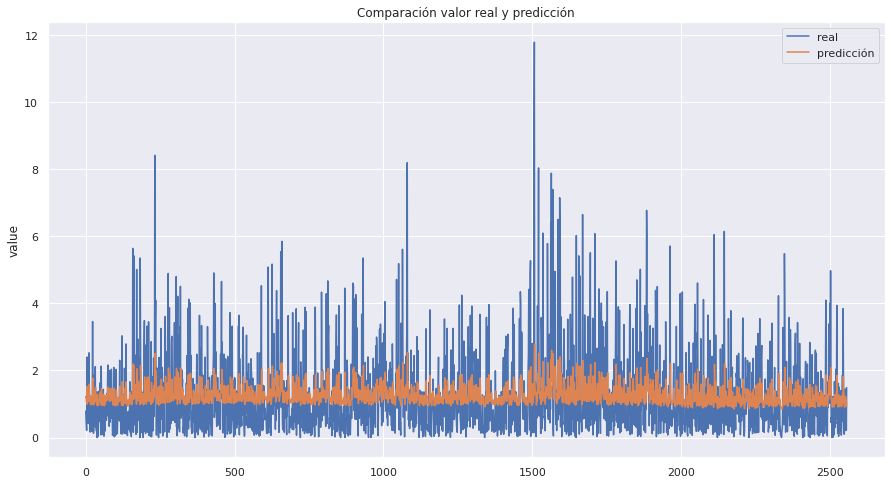

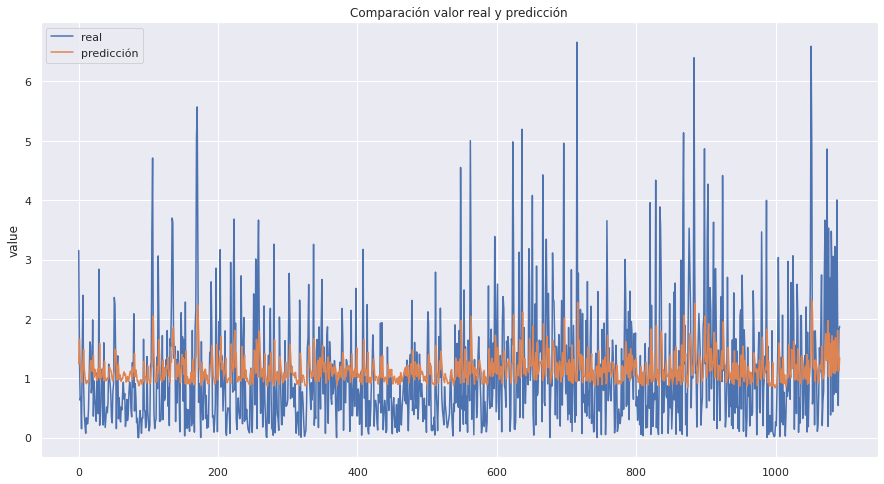

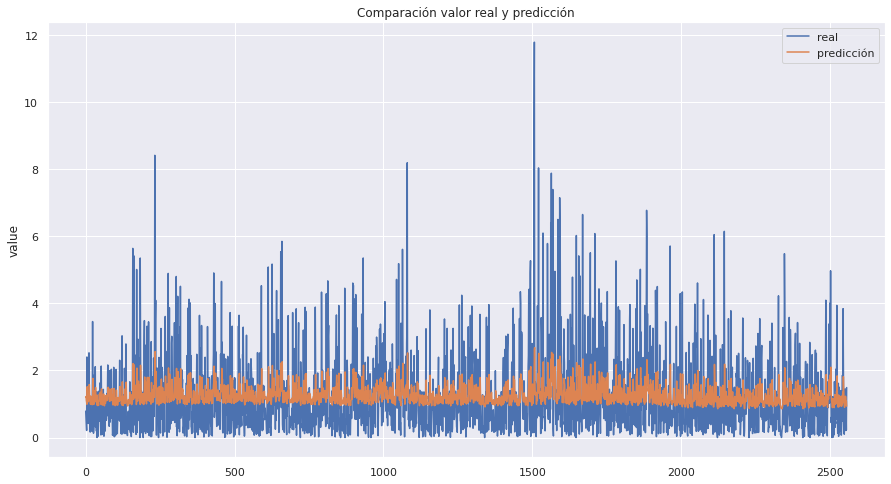

...

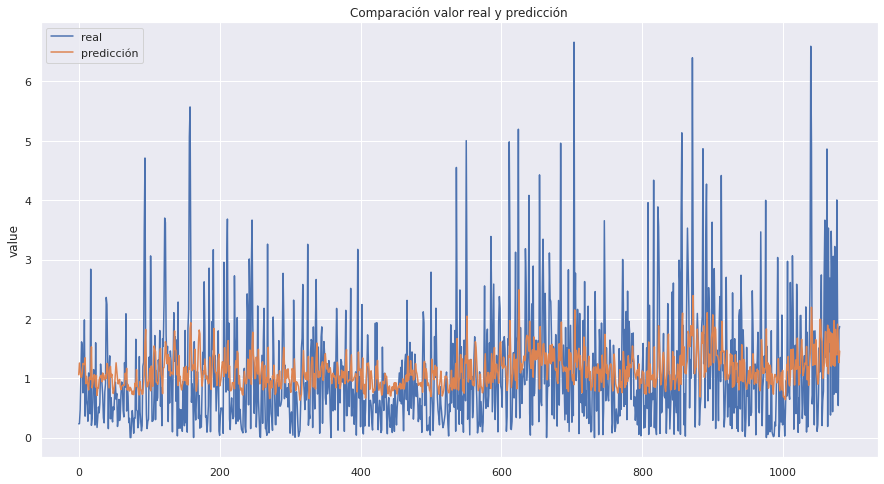

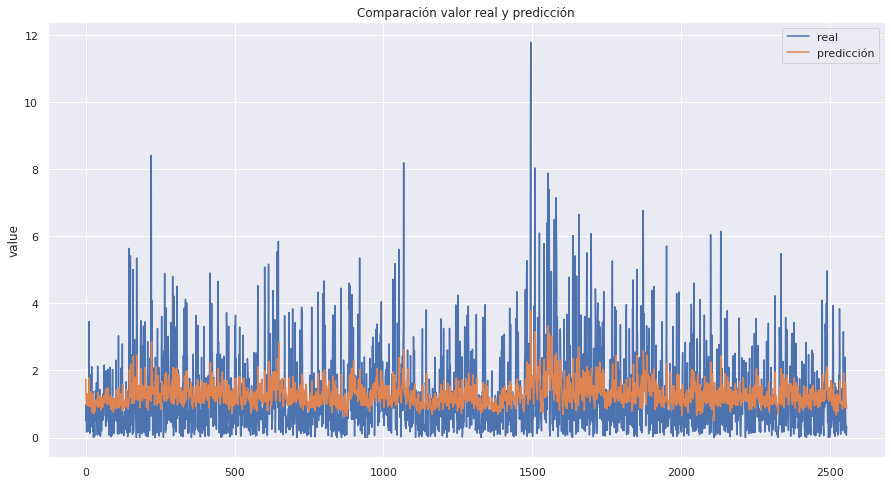

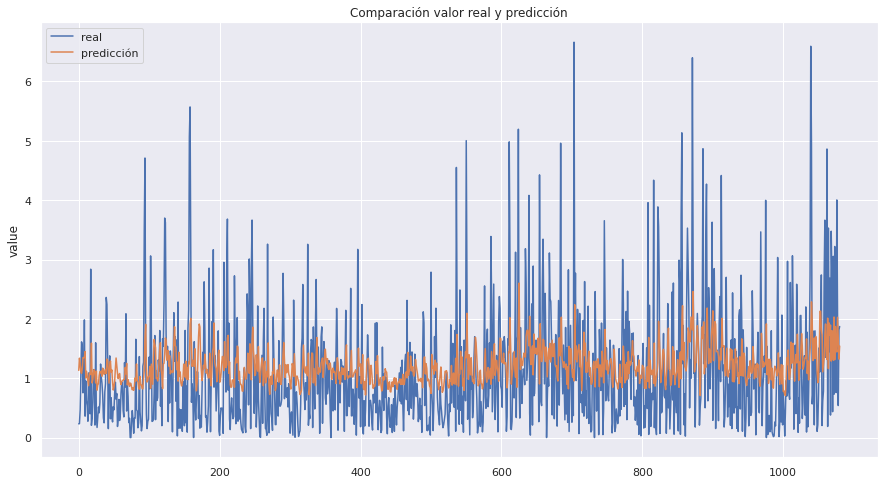

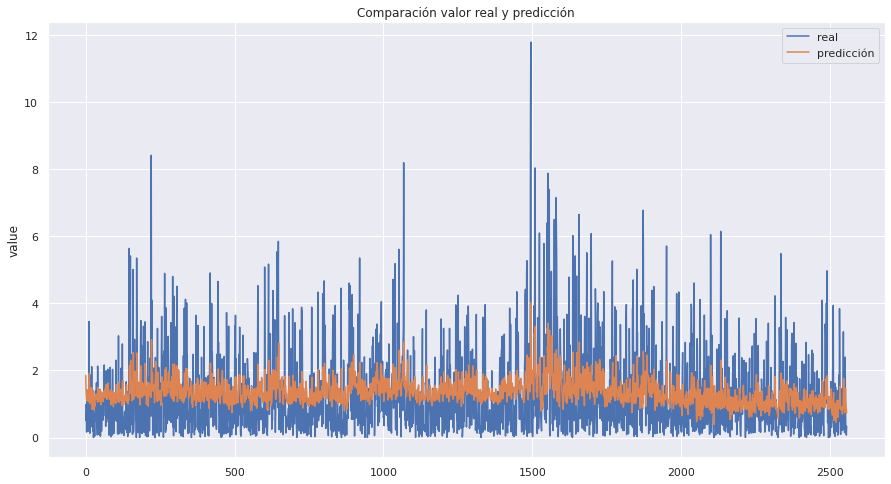

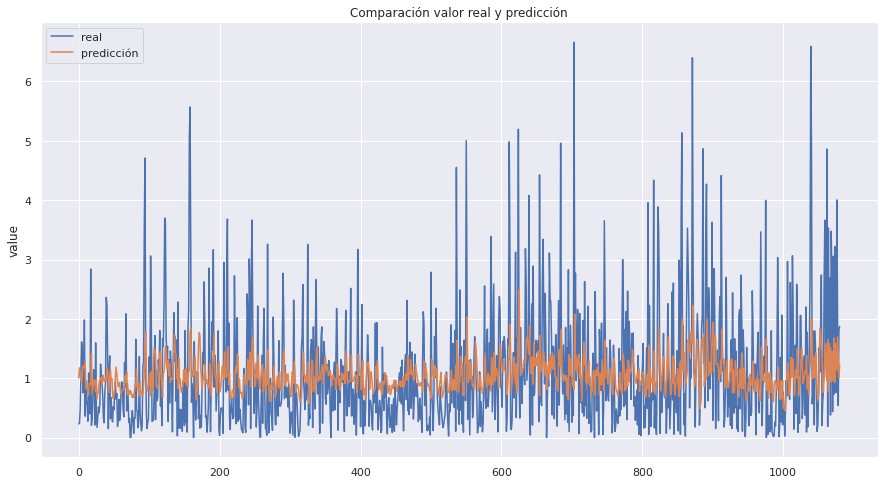

In [11]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500,2000])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)